In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline
import os
import glob
from numpy.linalg import inv
from moviepy.editor import VideoFileClip
from IPython.display import HTML

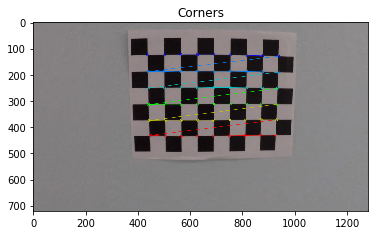

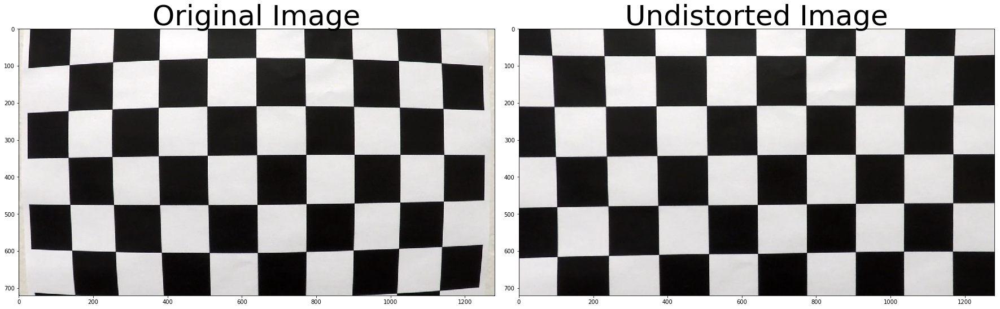

In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.imshow(img)
        plt.title('Corners')

def cal_undistort(img, objpoints, imgpoints):
    # Use cv2.calibrateCamera() and cv2.undistort()
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    return mtx,dist

img = mpimg.imread('camera_cal/calibration1.jpg')
mtx,dist = cal_undistort(img, objpoints, imgpoints)

#Undistorted Image
undt = cv2.undistort(img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undt)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [3]:
def color_gradient(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    return combined_binary

def hist(img):
    # TO-DO: Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]

    # TO-DO: Sum across image pixels vertically - make sure to set `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram =  np.sum(bottom_half, axis=0)
    
    return histogram

def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    rightx_base =1000

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 10
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radius of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img,left_fit,right_fit,left_curverad,right_curverad

def fit_polynomial2(binary_warped): 
    #this does not generate visualization!! it computes the base points to check the center latter - used in the pipeline
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radius of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    #calculation of the base point of left and right lane curve
    left_base = left_fit[0]*(y_eval)**2 + left_fit[1]*(y_eval) + left_fit[2]
    right_base = right_fit[0]*(y_eval)**2 + right_fit[1]*(y_eval) + right_fit[2]
    
    return left_fit,right_fit,left_curverad,right_curverad,left_base,right_base

def fit_poly(leftx, lefty, rightx, righty):
     ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit2 = np.polyfit(lefty, leftx, 2)
    right_fit2 = np.polyfit(righty, rightx, 2)
   
    return left_fit2, right_fit2

def search_around_poly(binary_warped):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    #print(left_fit,right_fit)
    
    # Fit new polynomials
    left_fit2,right_fit2 = fit_poly(leftx, lefty, rightx, righty)
    #print(left_fit2,right_fit2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
    right_fitx = right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radius of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result_lane = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result_lane,left_fit2,right_fit2,left_curverad,right_curverad

def search_around_poly2(binary_warped):
    #this does not generate visualization!! it computes the base points to check the center latter - used in the pipeline
    
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
   
    # Fit new polynomials
    #print(left_fit,right_fit)
    left_fit2,right_fit2 = fit_poly(leftx, lefty, rightx, righty)
    #print(left_fit2,right_fit2)
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radius of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    #calculation of the base point of left and right lane curve
    left_base = left_fit2[0]*(y_eval)**2 + left_fit2[1]*(y_eval) + left_fit2[2]
    right_base = right_fit2[0]*(y_eval)**2 + right_fit2[1]*(y_eval) + right_fit2[2]
       
    return left_fit2,right_fit2,left_curverad,right_curverad,left_base,right_base

In [4]:
os.listdir("test_images/")

['test1.jpg',
 'test3.jpg',
 'straight_lines2.jpg',
 'test4.jpg',
 'straight_lines1.jpg',
 'test5.jpg',
 'test6.jpg',
 'test2.jpg']

This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)


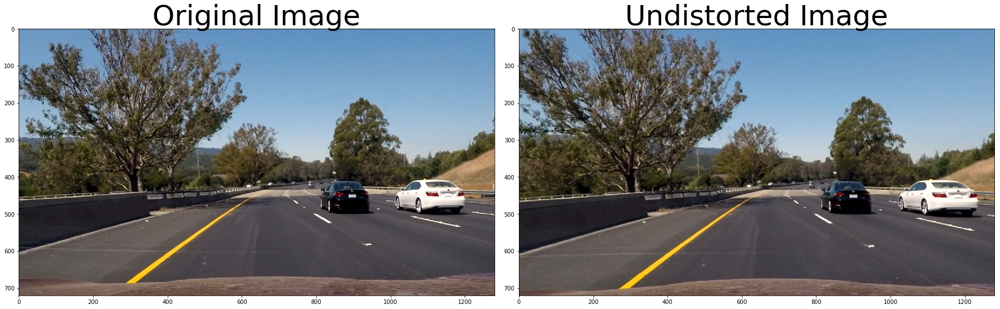

In [5]:
#reading in an image
image = mpimg.imread('test_images/test6.jpg')

#printing out some stats and plotting
print('This image is:', type(image), 'with dimensions:', image.shape)
#plt.imshow(image)  # if you wanted to show a single color channel image called 'gray', for example, call as plt.imshow(gray, cmap='gray')

#Undistorted Image
undistorted = cv2.undistort(image, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

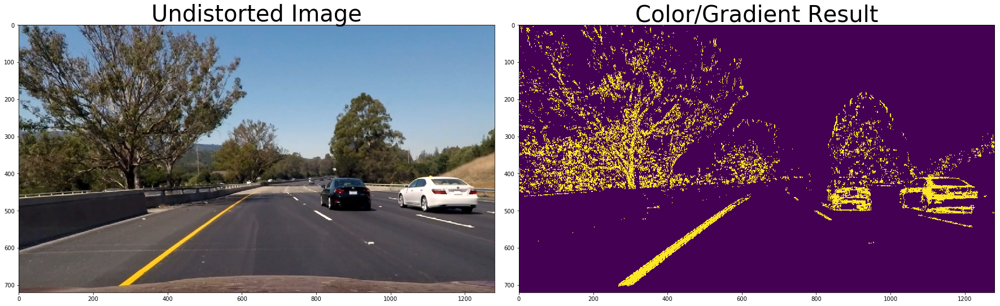

In [6]:
# Thresholding

result = color_gradient(undistorted)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(undistorted)
ax1.set_title('Undistorted Image', fontsize=40)

ax2.imshow(result)
ax2.set_title('Color/Gradient Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

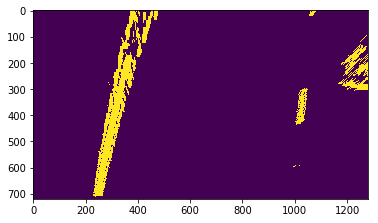

In [7]:
#Perspective Transform of a trapezoidal region

ymax=result.shape[0] #number of rows is th y coordinate
ymin=0
xmin=0
xmax=result.shape[1] #number of columns is th y coordinate

imshape = image.shape

img_size = (xmax, ymax)
offset = 200 # offset for dst points

#src = np.float32([p4,p2,p1,p3]) #top/left,top/rigth,bot/right,bot/left
src = np.float32([(550,470),(750,470),(imshape[1],imshape[0]),(200,imshape[0])]) #top/left,top/rigth,bot/right,bot/left
dst = np.float32([[offset, ymin], [xmax-offset, ymin], 
                                     [xmax-offset, ymax], 
                                     [offset, ymax]])

M = cv2.getPerspectiveTransform(src, dst)

warp = cv2.warpPerspective(result, M, img_size)
plt.imshow(warp)

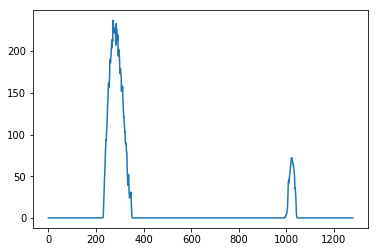

In [8]:
# Create histogram of image binary activations
histogram = hist(warp)

# Visualize the resulting histogram
plt.plot(histogram)

[  1.34133452e-04  -3.41304916e-01   4.23772729e+02] [  2.89947091e-05  -1.25473959e-01   1.06856372e+03]
1225.00435799 5664.98364186


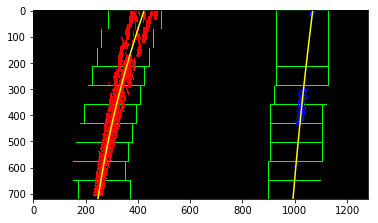

In [9]:
list_fit=[]
list_curvature=[]

#fit polinomials with sliding windows
out_img,left_fit,right_fit,left_curverad,right_curverad = fit_polynomial(warp)
print(left_fit,right_fit)
list_fit.append([left_fit,right_fit])
list_curvature.append([left_curverad,right_curverad])

plt.imshow(out_img)
print(left_curverad,right_curverad)

1225.00435799 5664.98364185


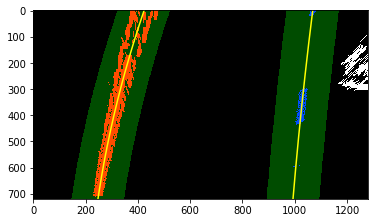

In [10]:
#fit polinomials with search from prior
result_lane,left_fit,right_fit,left_curverad,right_curverad = search_around_poly(warp)
list_fit.append([left_fit,right_fit])
list_curvature.append([left_curverad,right_curverad])

# View your output
plt.imshow(result_lane)

print(left_curverad,right_curverad)

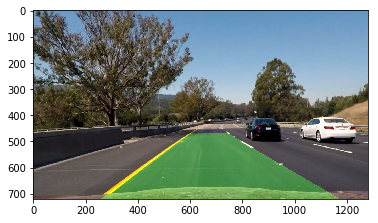

In [11]:
# Create an image to draw the lines on
warp_zero = np.zeros_like(warp).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
# Generate x and y values for plotting
ploty = np.linspace(0, warp.shape[0]-1, warp.shape[0])
### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, inv(M), (image.shape[1], image.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(undistorted, 1, newwarp, 0.3, 0)
plt.imshow(result)

In [12]:
#all togheter in one pipeline

def pipeline(image):
    
    undistorted = cv2.undistort(image, mtx, dist, None, mtx)
    
    result = color_gradient(undistorted)
       
    ymax=result.shape[0] #number of rows is th y coordinate
    ymin=0
    xmin=0
    xmax=result.shape[1] #number of columns is th y coordinate

    imshape = image.shape
    
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    img_size = (xmax, ymax)
    offset = 200 # offset for dst points
    
    #src = np.float32([(400,500),(800,500),(imshape[1],imshape[0]),(200,imshape[0])]) #top/left,top/rigth,bot/right,bot/left
    src = np.float32([(550,470),(750,470),(imshape[1],imshape[0]),(200,imshape[0])]) #top/left,top/rigth,bot/right,bot/left
    dst = np.float32([[offset, ymin], [xmax-offset, ymin], 
                                         [xmax-offset, ymax], 
                                         [offset, ymax]])

    M = cv2.getPerspectiveTransform(src, dst)

    warp = cv2.warpPerspective(result, M, img_size)
    
    if len(list_fit)<3:
        left_fit,right_fit,left_curverad,right_curverad,left_base,right_base = fit_polynomial2(warp)
        center=((right_base-left_base)/2)+left_base-xmax/2
        curverad=np.round(np.minimum(left_curverad,right_curverad),2)
        list_fit.append([left_fit,right_fit])
        list_curvature.append([left_curverad,right_curverad])
    elif len(list_fit)>=3:
        left_fit,right_fit,left_curverad,right_curverad,left_base,right_base = search_around_poly2(warp)
        if left_curverad-list_curvature[-1][0]<100 or left_curverad-list_curvature[-1][0]>5000 or left_curverad-list_curvature[-1][0]<-5000 or np.abs(left_fit[0])>1e-3 or np.abs(right_fit[0])>1e-3:
            left_fit,right_fit,left_curverad,right_curverad,left_base,right_base = fit_polynomial2(warp)
            #print(right_fit[0])
            if np.abs(left_fit[0])>1e-3 or np.abs(right_fit[0])>1e-3:
                #print('entrou')
                left_fit=(list_fit[-1][0]+list_fit[-2][0]+list_fit[-3][0])/3
                right_fit=(list_fit[-1][1]+list_fit[-2][1]+list_fit[-3][1])/3
                left_curverad=(list_curvature[-1][0]+list_curvature[-2][0]+list_curvature[-3][0])/3
                right_curverad=(list_curvature[-1][1]+list_curvature[-2][1]+list_curvature[-3][1])/3
        left_fit=(left_fit+list_fit[-1][0]+list_fit[-2][0]+list_fit[-3][0])/4
        right_fit=(right_fit+list_fit[-1][1]+list_fit[-2][1]+list_fit[-3][1])/4
        left_curverad=(left_curverad+list_curvature[-1][0]+list_curvature[-2][0]+list_curvature[-3][0])/4
        right_curverad=(right_curverad+list_curvature[-1][1]+list_curvature[-2][1]+list_curvature[-3][1])/4
        center=((right_base-left_base)/2)+left_base-xmax/2
        curverad=np.round(np.minimum(left_curverad,right_curverad),2)
        list_fit.append([left_fit,right_fit])
        list_curvature.append([left_curverad,right_curverad])
          
        
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warp).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    # Generate x and y values for plotting
    ploty = np.linspace(0, warp.shape[0]-1, warp.shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, inv(M), (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    final = cv2.addWeighted(undistorted, 1, newwarp, 0.3, 0)
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    my_text='Curvature:'+str(curverad)+'m'
    cv2.putText(final, my_text, (10,100), font, 3, (0, 255, 0), 2, cv2.LINE_AA)
    if center<0:
        my_text=str(np.round(np.abs(center*xm_per_pix),2))+'m left of the center'
    else:
        my_text=str(np.round(np.abs(center*xm_per_pix),2))+'m righ of the center'
    cv2.putText(final, my_text, (10,200), font, 3, (0, 255, 0), 2, cv2.LINE_AA)
    
    return final
    

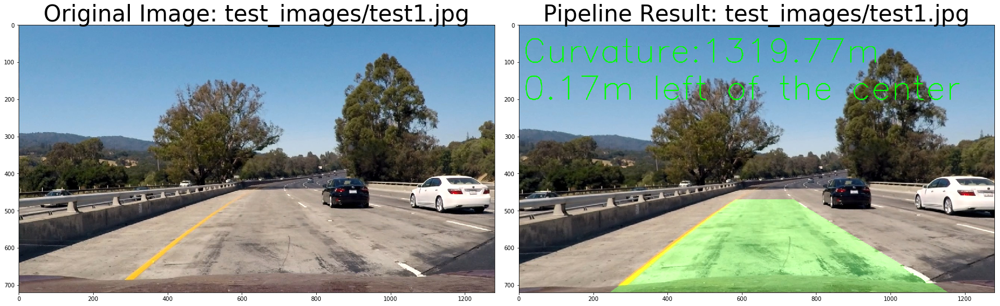

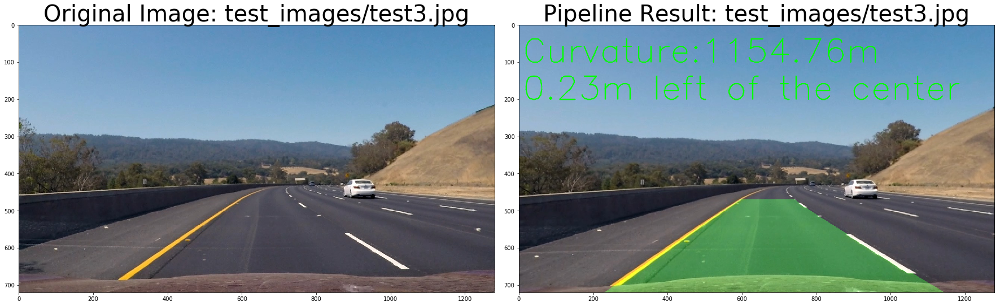

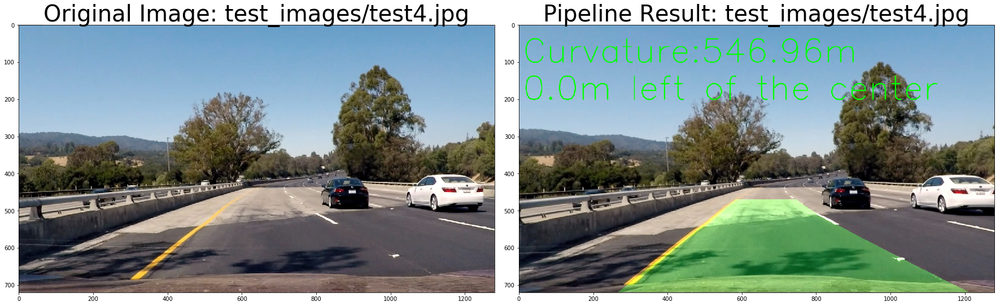

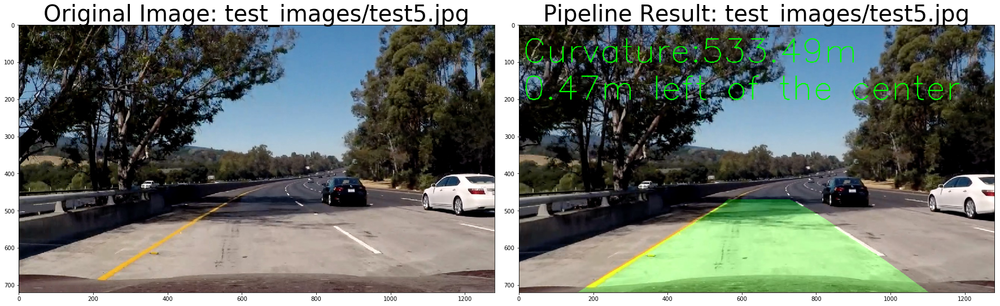

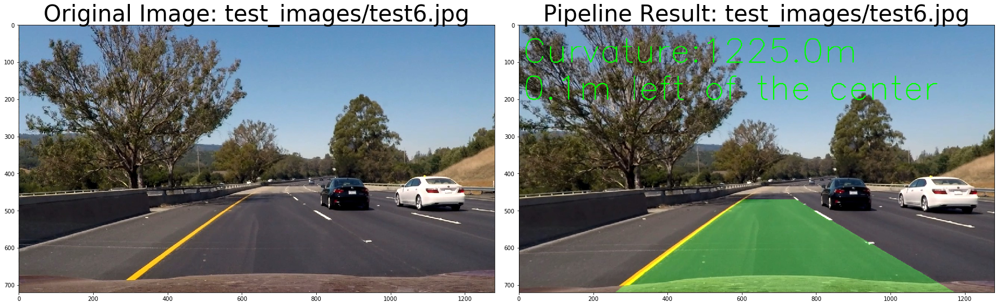

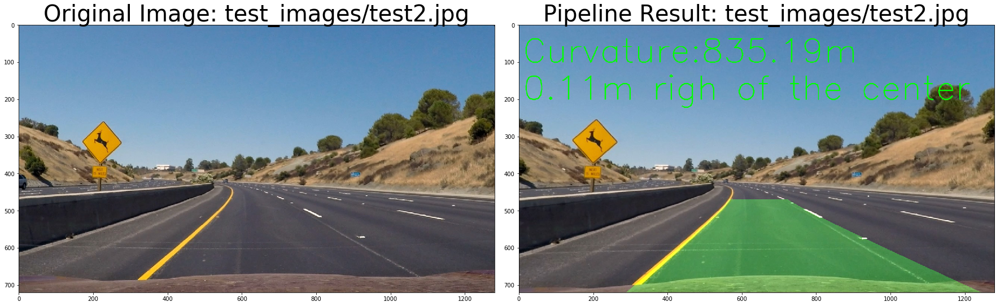

In [13]:
#pipeline with one image  

# Make a list of calibration images
images = glob.glob('test_images/test*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    image = mpimg.imread(fname)
    list_fit=[]
    list_curvature=[]
    final=pipeline(image)
    
    plt.imsave('output_images/'+fname,final)
        
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image: '+fname, fontsize=40)
    ax2.imshow(final)
    ax2.set_title('Pipeline Result: '+fname, fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [14]:
#pipeline with video

white_output = 'output_images/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,10)
clip1 = VideoFileClip("project_video.mp4")
list_fit=[]
list_curvature=[]
white_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video output_images/project_video.mp4
[MoviePy] Writing video output_images/project_video.mp4


100%|█████████▉| 1260/1261 [04:43<00:00,  4.04it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/project_video.mp4 

CPU times: user 2min 15s, sys: 21.7 s, total: 2min 36s
Wall time: 4min 46s
